In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier
#  import lightgbm as lgb
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score,roc_curve
from sklearn.metrics import accuracy_score, classification_report
import functions as mylib

import time
import plotly.graph_objects as go
import plotly.figure_factory as ff
import plotly.express as px
import lightgbm as lgb
import warnings
warnings.filterwarnings('ignore') 

<div style="background-color: #2bcf34; color: white; border-left: 6px solid #94f298; padding: 10px; font-family: Verdana;">
    <h3>Content</h3>
</div>
<div style="background-color: #94f298; color: white; border-left: 6px solid #94f298; padding: 10px; font-size: 15px; font-family: Verdana;">
    <strong>
    <ul>
        <li>Data Exploration</li>
        <li>Visualization
            <ul>
                <li>Pie Plot</li>
                <li>Bar Plot</li>
                <li>Box Plot</li>
                <li>KDE Plot</li>
                <li>Heatmap</li>
            </ul>
        </li>
        <li>Outlier Detection</li>
        <li>Prediction - 'Preference' Feature</li>
        <li>Preprocessing and Prediciton</li>
        <li>Feature Importance</li>
        <li>Elbow Method</li>
        <li>Results with and without feature selection</li>
        <li>Hyperparameter Tuning and cross validation on selected feature</li>
    </ul>
    </strong>
</div>

In [2]:
df = pd.read_csv("mountains_vs_beaches_preferences.csv")
df.tail(3)

,Age,Gender,Income,Education_Level,Travel_Frequency,Preferred_Activities,Vacation_Budget,Location,Proximity_to_Mountains,Proximity_to_Beaches,Favorite_Season,Pets,Environmental_Concerns,Preference
52441,53,non-binary,71080,doctorate,7,swimming,3877,urban,164,27,fall,0,1,0
52442,40,female,75174,doctorate,9,swimming,4620,suburban,173,10,summer,0,1,0
52443,33,non-binary,34475,master,6,hiking,928,suburban,218,166,spring,1,0,0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52444 entries, 0 to 52443
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Age                     52444 non-null  int64 
 1   Gender                  52444 non-null  object
 2   Income                  52444 non-null  int64 
 3   Education_Level         52444 non-null  object
 4   Travel_Frequency        52444 non-null  int64 
 5   Preferred_Activities    52444 non-null  object
 6   Vacation_Budget         52444 non-null  int64 
 7   Location                52444 non-null  object
 8   Proximity_to_Mountains  52444 non-null  int64 
 9   Proximity_to_Beaches    52444 non-null  int64 
 10  Favorite_Season         52444 non-null  object
 11  Pets                    52444 non-null  int64 
 12  Environmental_Concerns  52444 non-null  int64 
 13  Preference              52444 non-null  int64 
dtypes: int64(9), object(5)
memory usage: 5.6+ MB


In [4]:
for i in df.columns:
    print(df[i].value_counts())
    print("---------------")

Age
34    1099
65    1097
30    1083
40    1078
32    1063
43    1061
69    1057
64    1053
45    1050
55    1038
61    1035
35    1031
46    1031
21    1023
56    1023
47    1014
59    1014
33    1013
53    1013
26    1012
27    1012
38    1012
22    1012
68    1009
62    1007
41    1006
42    1005
39    1004
36    1004
31    1001
19    1001
58    1001
54    1000
20    1000
49     999
25     999
57     989
24     987
28     981
66     980
44     979
50     976
52     975
29     972
23     969
48     965
37     964
63     960
18     958
67     958
51     946
60     925
Name: count, dtype: int64
---------------
Gender
female        17638
male          17522
non-binary    17284
Name: count, dtype: int64
---------------
Income
109283    7
114814    6
72412     6
96111     5
117850    5
         ..
71676     1
119865    1
118380    1
33918     1
34475     1
Name: count, Length: 40983, dtype: int64
---------------
Education_Level
doctorate      13293
bachelor       13127
high school    1307

<div class="alert alert-success" style="background-color: #a5e8a8; color:#245209;" role="alert ">
  Target is Preference
</div>

In [5]:
continuous_features = mylib.find_continuous_columns(df)
print(continuous_features)

Continuous Features: ['Age', 'Income', 'Vacation_Budget', 'Proximity_to_Mountains', 'Proximity_to_Beaches']
['Age', 'Income', 'Vacation_Budget', 'Proximity_to_Mountains', 'Proximity_to_Beaches']


In [6]:
mylib.check_nan_value_ratio(df)

Age : %0.00000
Gender : %0.00000
Income : %0.00000
Education_Level : %0.00000
Travel_Frequency : %0.00000
Preferred_Activities : %0.00000
Vacation_Budget : %0.00000
Location : %0.00000
Proximity_to_Mountains : %0.00000
Proximity_to_Beaches : %0.00000
Favorite_Season : %0.00000
Pets : %0.00000
Environmental_Concerns : %0.00000
Preference : %0.00000


In [7]:
categorical_features = set(df.columns)-set(continuous_features)
categorical_features.remove('Preference')

In [8]:
df.isnull().sum()

Age                       0
Gender                    0
Income                    0
Education_Level           0
Travel_Frequency          0
Preferred_Activities      0
Vacation_Budget           0
Location                  0
Proximity_to_Mountains    0
Proximity_to_Beaches      0
Favorite_Season           0
Pets                      0
Environmental_Concerns    0
Preference                0
dtype: int64

In [9]:
print(f"is there any duplicate row : {df.duplicated().any()}")
print(df[df.duplicated()])

is there any duplicate row : False
Empty DataFrame
Columns: [Age, Gender, Income, Education_Level, Travel_Frequency, Preferred_Activities, Vacation_Budget, Location, Proximity_to_Mountains, Proximity_to_Beaches, Favorite_Season, Pets, Environmental_Concerns, Preference]
Index: []


<div style="color: white; display: block; border-radius: 5px; background-color: #2bcf34; width: 50%; height: 60%; font-size: 110%; font-family: Verdana; letter-spacing: 0.5px;">
    <h2 style="padding: 10px; color: white;">Visualization</h2>
</div>

<div style="color: white; display: block; border-radius: 5px; background-color: #2bcf34; width: 50%; height: 60%; font-size: 80%; font-family: Verdana; letter-spacing: 0.5px;">
    <h2 style="padding: 10px; color: white;">Pie Plot</h2>
</div>

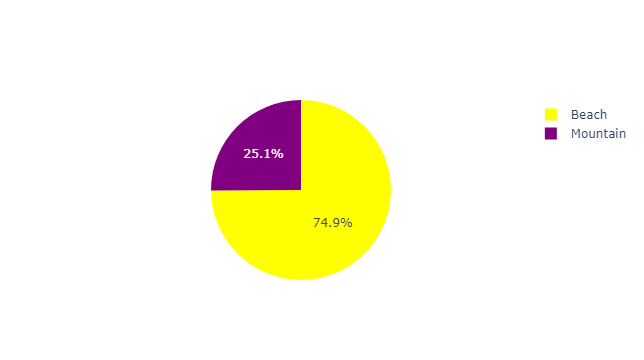

In [45]:
labels = ['Beach', 'Mountain'] # 0, 1
values = df.Preference.value_counts()
colors = ['yellow', 'purple']
fig = go.Figure(data=[go.Pie(labels=labels, values=values, marker=dict(colors=colors))])
fig.show()

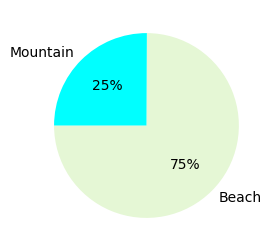

In [65]:
labels = ['Beach', 'Mountain'] # 0, 1
values = df.Preference.value_counts()
plt.figure(figsize=(3,3))
palette_color = ['#e5f7d5', 'cyan']
plt.pie(values, labels=labels, colors=palette_color, autopct='%.0f%%', startangle=180, textprops={'color': 'black'}) 
plt.show() 

<div class="alert alert-success" style="background-color: #a5e8a8; color:#245209;" role="alert ">
  Dataset is imbalanced.
</div>

<div style="color: white; display: block; border-radius: 5px; background-color: #2bcf34; width: 50%; height: 60%; font-size: 80%; font-family: Verdana; letter-spacing: 0.5px;">
    <h2 style="padding: 10px; color: white;">Bar Plot</h2>
</div>

In [10]:
df.columns

Index(['Age', 'Gender', 'Income', 'Education_Level', 'Travel_Frequency',
       'Preferred_Activities', 'Vacation_Budget', 'Location',
       'Proximity_to_Mountains', 'Proximity_to_Beaches', 'Favorite_Season',
       'Pets', 'Environmental_Concerns', 'Preference'],
      dtype='object')

In [11]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

bar_plot_features = ['Age', 'Gender', 'Education_Level', 'Travel_Frequency', 'Preferred_Activities', 'Location', 'Favorite_Season', 'Pets', 'Environmental_Concerns']

fig = make_subplots(rows=len(bar_plot_features), cols=1, subplot_titles = bar_plot_features,  shared_yaxes=True)

for ind, i in enumerate(bar_plot_features):
    # Add histograms for preference 1 and 0
    fig.add_trace(go.Histogram(
        x=df[df['Preference'] == 1][i],
        name='Class 1',
        legendgroup='Class 1',
        opacity=0.75,
        marker=dict(color='blue', line=dict(color='black', width=2))), row=ind+1, col=1)
    
    fig.add_trace(go.Histogram(
        x=df[df['Preference'] == 0][i],
        name='Class 0',
        legendgroup='Class 0',
        opacity=0.5, 
        marker=dict(color='red', line=dict(color='black', width=2))), row=ind+1, col=1)
    
# Update the layout to group the histograms side by side
fig.update_layout(
    barmode='overlay',
    yaxis_title='Count',
    showlegend=True,
    legend=dict(
        x=1.1,  # Sağ kısma konumlandırma
        y=1,
        title='Class',
        traceorder='normal'
    ),
    xaxis=dict(
        tickmode='linear'
    ), height=2400, width=800)

fig.show()

<div style="color: white; display: block; border-radius: 5px; background-color: #2bcf34; width: 50%; height: 60%; font-size: 80%; font-family: Verdana; letter-spacing: 0.5px;">
    <h2 style="padding: 10px; color: white;">Box Plot</h2>
</div>

In [12]:
continuous_columns = mylib.find_continuous_columns(df)

Continuous Features: ['Age', 'Income', 'Vacation_Budget', 'Proximity_to_Mountains', 'Proximity_to_Beaches']


In [13]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

box_plot_features = continuous_columns

fig = make_subplots(rows=len(box_plot_features), cols=1, subplot_titles = box_plot_features,  shared_yaxes=True)

for ind, i in enumerate(box_plot_features):
    # Add histograms for preference 1 and 0
    fig.add_trace(go.Box(
        x=df[df['Preference'] == 1][i],
        name='Class 1',
        legendgroup='Class 1',
        marker=dict(color='blue', line=dict(color='black', width=2))), row=ind+1, col=1)
    
    fig.add_trace(go.Box(
        x=df[df['Preference'] == 0][i],
        name='Class 0',
        legendgroup='Class 0',
        marker=dict(color='red', line=dict(color='black', width=2))), row=ind+1, col=1)
    
# Update the layout to group the histograms side by side
fig.update_layout(
    barmode='overlay',
    yaxis_title='Count',
    showlegend=True,
    legend=dict(
        x=1.1,  # Sağ kısma konumlandırma
        y=1,
        title='Class',
        traceorder='normal'
    ),
    xaxis=dict(
        tickmode='linear'
    ), height=1200, width=800)

fig.show()

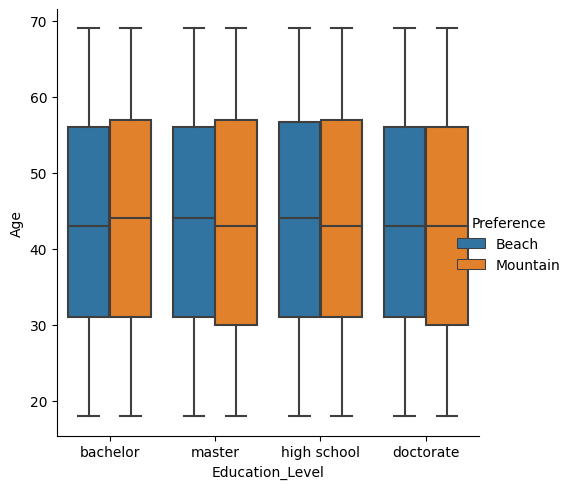

In [14]:
g = sns.catplot(data=df, x="Education_Level", y="Age", hue="Preference", kind="box")
new_labels = ['Beach', 'Mountain']
for t, l in zip(g._legend.texts, new_labels):
    t.set_text(l)
plt.show()

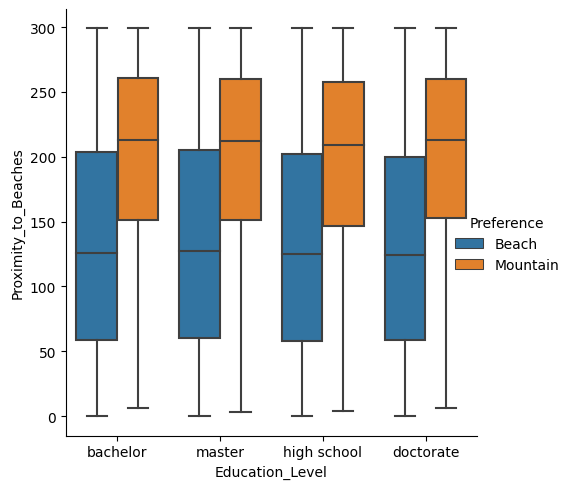

In [15]:
g = sns.catplot(data=df, x="Education_Level", y="Proximity_to_Beaches", hue="Preference", kind="box") # 0 = Beach , hue_order=['Beach', 'Mountain']

new_labels = ['Beach', 'Mountain']
for t, l in zip(g._legend.texts, new_labels):
    t.set_text(l)
plt.show()

<div style="color: white; display: block; border-radius: 5px; background-color: #2bcf34; width: 50%; height: 60%; font-size: 80%; font-family: Verdana; letter-spacing: 0.5px;">
    <h2 style="padding: 10px; color: white;">KDE Plot</h2>
</div>

In [16]:
continuous_columns

['Age',
 'Income',
 'Vacation_Budget',
 'Proximity_to_Mountains',
 'Proximity_to_Beaches']

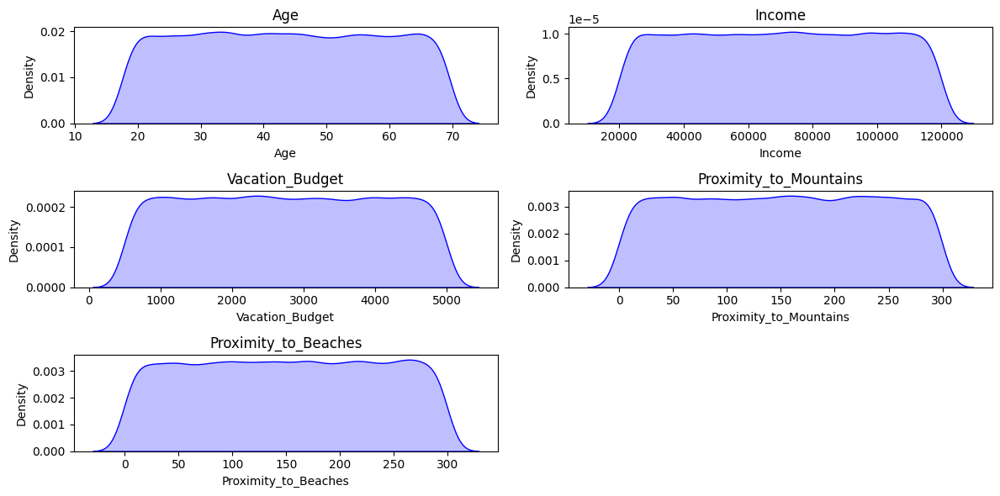

Geçen süre: 1.15 saniye


In [17]:
ncolumns = 2
nrow = (len(continuous_columns) // ncolumns) + (1 if len(continuous_columns) % ncolumns != 0 else 0)
fig, axes = plt.subplots(nrow, ncolumns, figsize=(12, 6))

start_time = time.perf_counter()

axes = axes.flatten()
for i, feature in enumerate(continuous_columns):
    sns.kdeplot(df[feature], ax=axes[i], color='blue', fill=True)
    axes[i].set_title(feature)
for j in range(len(continuous_columns), len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout()
plt.show()
end_time = time.perf_counter()
elapsed_time = end_time - start_time
print(f"Geçen süre: {elapsed_time:.2f} saniye")

<div style="color: white; display: block; border-radius: 5px; background-color: #2bcf34; width: 50%; height: 60%; font-size: 80%; font-family: Verdana; letter-spacing: 0.5px;">
    <h2 style="padding: 10px; color: white;">Heatmap</h2>
</div>

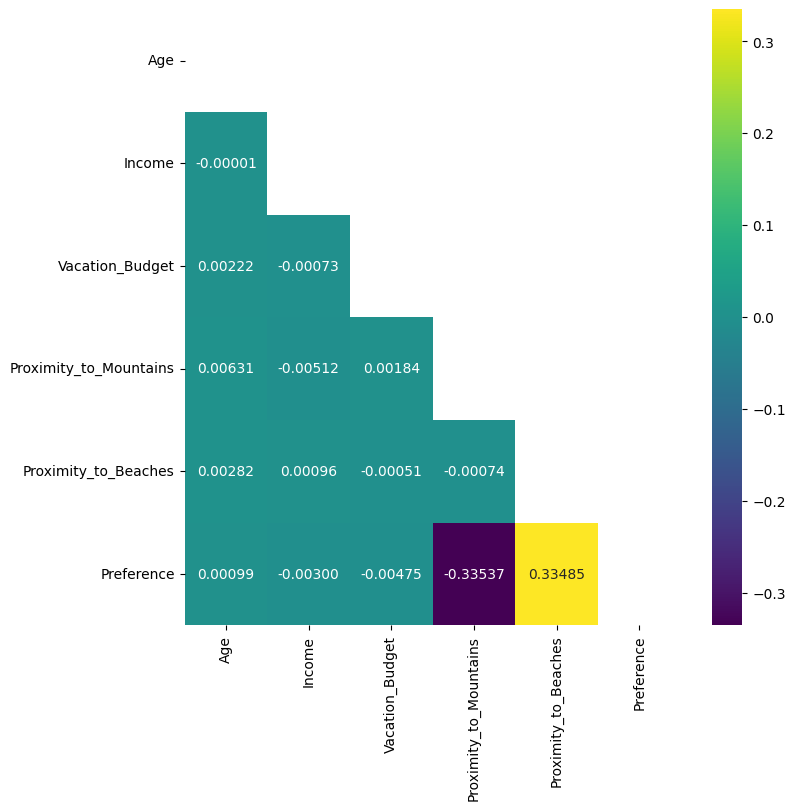

In [18]:
from matplotlib.colors import LinearSegmentedColormap
data = df.drop(columns=categorical_features)
mask = np.triu(np.ones_like(data.corr()))
plt.figure(figsize=(8,8))  
plot = sns.heatmap(data.corr(), cmap='viridis', annot=True, mask=mask, fmt = ".5f") 

# displaying heatmap 
plt.show() 

<div class="alert alert-success" style="background-color: #a5e8a8; color:#245209;" role="alert ">
  proximity to beach and mountains directly affects the preferences of people.
</div>

<div style="color: white; display: block; border-radius: 5px; background-color: #2bcf34; width: 50%; height: 60%; font-size: 80%; font-family: Verdana; letter-spacing: 0.5px;">
    <h2 style="padding: 10px; color: white;">Outlier Detection</h2>
</div>

In [19]:
numerical_features = set(df.columns) - set(categorical_features)
numerical_features.remove('Preference')
numerical_features = list(numerical_features)
print(numerical_features)

['Age', 'Proximity_to_Mountains', 'Vacation_Budget', 'Income', 'Proximity_to_Beaches']


In [20]:
df.loc[mylib.detect_outliers(df, numerical_features)]

,Age,Gender,Income,Education_Level,Travel_Frequency,Preferred_Activities,Vacation_Budget,Location,Proximity_to_Mountains,Proximity_to_Beaches,Favorite_Season,Pets,Environmental_Concerns,Preference


In [21]:
y= df.iloc[:,-1]
zero_ratio = np.round(len(y[y==0]) / len(y), decimals=2)

<div class="alert alert-success" style="background-color: #a5e8a8; color:#245209;" role="alert ">
  There is no outlier data.
</div>

<div style="color: white; display: block; border-radius: 5px; background-color: #2bcf34; width: 100%; height: 60%; font-size: 80%; font-family: Verdana; letter-spacing: 0.5px;">
    <h2 style="padding: 10px; color: white;">Prediction - 'Preference' Feature</h2>
</div>

<div class="alert alert-success" style="background-color: #a5e8a8; color:#245209;" role="alert ">
  <ul>
      <li>Random Forest</li>
      <li>XGBoost</li>
      <li>AdaBoost</li>
      <li>LightGBM</li>
      <li>CatBoost</li>
  </ul>
</div>

In [22]:
!pip install colorama -q

In [23]:
from colorama import Fore, Style

<div style="display: flex; align-items: flex-start; padding: 10px;">
    <div style="flex: 1; padding-right: 10px;">
    <img src="https://image.hurimg.com/i/hurriyet/75/750x422/55ea7154f018fbb8f8803d34.jpg" width="100"/>
    </div>
    <div style="flex: 2; padding-right: 0px;">
    <h3>Catboost</h3>
    </div> 
</div>

In [24]:
import catboost as cb
from catboost import CatBoostClassifier

In [25]:
?CatBoostClassifier

Init signature:
CatBoostClassifier(
    iterations=None,
    learning_rate=None,
    depth=None,
    l2_leaf_reg=None,
    model_size_reg=None,
    rsm=None,
    loss_function=None,
    border_count=None,
    feature_border_type=None,
    per_float_feature_quantization=None,
    input_borders=None,
    output_borders=None,
    fold_permutation_block=None,
    od_pval=None,
    od_wait=None,
    od_type=None,
    nan_mode=None,
    counter_calc_method=None,
    leaf_estimation_iterations=None,
    leaf_estimation_method=None,
    thread_count=None,
    random_seed=None,
    use_best_model=None,
    best_model_min_trees=None,
    verbose=None,
    silent=None,
    logging_level=None,
    metric_period=None,
    ctr_leaf_count_limit=None,
    store_all_simple_ctr=None,
    max_ctr_complexity=None,
    has_time=None,
    allow_const_label=None,
    target_border=None,
    classes_count=None,
    class_weights=None,
    auto_class_weights=None,
    class_names=None,
    one_hot_max_size=Non

In [26]:
categorical_features = list(categorical_features)
print(categorical_features)

['Travel_Frequency', 'Pets', 'Education_Level', 'Environmental_Concerns', 'Favorite_Season', 'Preferred_Activities', 'Location', 'Gender']


In [27]:
for col in categorical_features:
    df[col] = df[col].astype('category')

In [28]:
# pip install lightgbm --config-settings=cmake.define.USE_GPU=ON --config-settings=cmake.define.OpenCL_INCLUDE_DIR="/usr/local/cuda/include/" --config-settings=cmake.define.OpenCL_LIBRARY="/usr/local/cuda/lib64/libOpenCL.so"

In [29]:
model_time = {}

Catboost
Training set performance
<class 'numpy.int64'>
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     31437
           1       1.00      1.00      1.00     10518

    accuracy                           1.00     41955
   macro avg       1.00      1.00      1.00     41955
weighted avg       1.00      1.00      1.00     41955

Roc-Auc Score Training set: 0.9993180386434094
Test set performance
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7859
           1       1.00      0.99      0.99      2630

    accuracy                           1.00     10489
   macro avg       1.00      1.00      1.00     10489
weighted avg       1.00      1.00      1.00     10489

Roc-Auc Score Test set: 0.9954342627207576
_._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._.


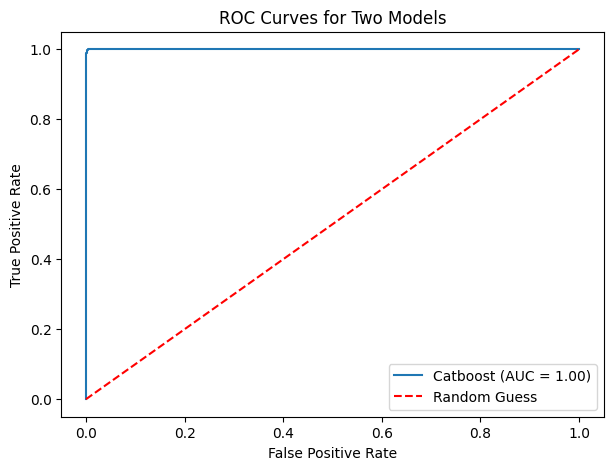

Fit + Predict time (seconds): 51.227792263031006


In [32]:
models={
    "Catboost": CatBoostClassifier(task_type='CPU', cat_features= list(categorical_features), logging_level="Silent")
}
catboost_cpu_time = mylib.make_prediction(models, df) 
model_time['catboost_cpu_time']=catboost_cpu_time

Catboost
Training set performance
<class 'numpy.int64'>
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     31437
           1       1.00      1.00      1.00     10518

    accuracy                           1.00     41955
   macro avg       1.00      1.00      1.00     41955
weighted avg       1.00      1.00      1.00     41955

Roc-Auc Score Training set: 0.9978268773260354
Test set performance
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7859
           1       0.99      0.99      0.99      2630

    accuracy                           1.00     10489
   macro avg       1.00      1.00      1.00     10489
weighted avg       1.00      1.00      1.00     10489

Roc-Auc Score Test set: 0.995242648833988
_._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._.


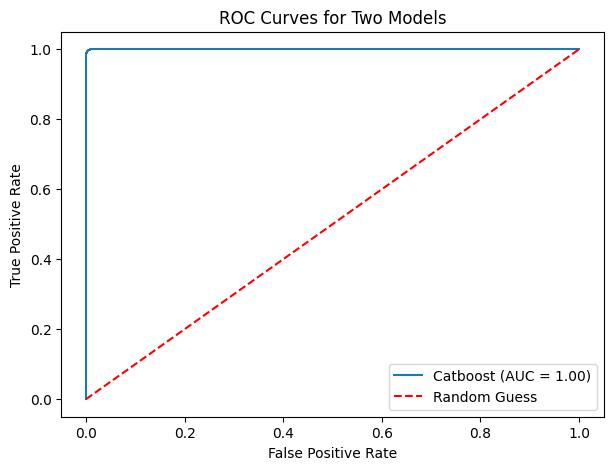

Fit + Predict time (seconds): 56.847468852996826


In [33]:
models={
    "Catboost": CatBoostClassifier(task_type='GPU', devices='0', gpu_ram_part=1, cat_features= list(categorical_features), logging_level="Silent")
}
catboost_1_time = mylib.make_prediction(models, df)
model_time['catboost_1_time']=catboost_1_time

Catboost
Training set performance
<class 'numpy.int64'>
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     31437
           1       1.00      1.00      1.00     10518

    accuracy                           1.00     41955
   macro avg       1.00      1.00      1.00     41955
weighted avg       1.00      1.00      1.00     41955

Roc-Auc Score Training set: 0.9978745918026076
Test set performance
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7859
           1       0.99      0.99      0.99      2630

    accuracy                           1.00     10489
   macro avg       1.00      1.00      1.00     10489
weighted avg       1.00      1.00      1.00     10489

Roc-Auc Score Test set: 0.9953698914857249
_._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._.


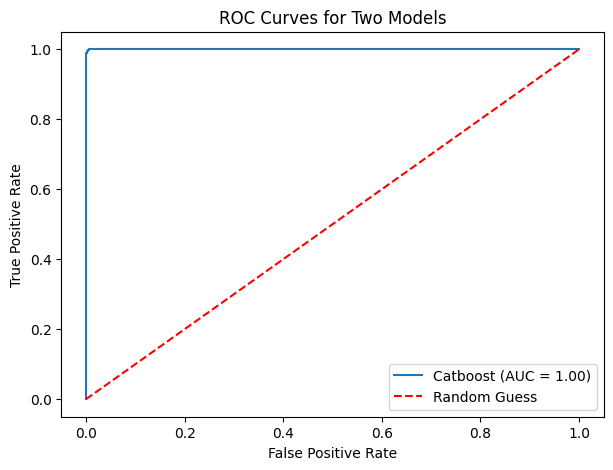

Fit + Predict time (seconds): 58.62866163253784


In [34]:
models={
    "Catboost": CatBoostClassifier(task_type='GPU', devices='0', gpu_ram_part=0.1, cat_features= list(categorical_features), logging_level="Silent")
}
catboost_2_time = mylib.make_prediction(models, df)
model_time['catboost_2_time']=catboost_2_time

[LightGBM] [Warning] categorical_feature is set=Location,Gender,Environmental_Concerns,Pets,Travel_Frequency,Preferred_Activities,Education_Level,Favorite_Season, categorical_column=1,3,4,5,7,10,11,12 will be ignored. Current value: categorical_feature=Location,Gender,Environmental_Concerns,Pets,Travel_Frequency,Preferred_Activities,Education_Level,Favorite_Season
[LightGBM] [Info] Number of positive: 10518, number of negative: 31437
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1075
[LightGBM] [Info] Number of data points in the train set: 41955, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500929 -> initscore=0.003715
[LightGBM] [Info] Start training from score 0.003715
LightGBM
Training set performance
<class 'numpy.int64'>
              precision    recall  f1-score   support

           0       1.00      1

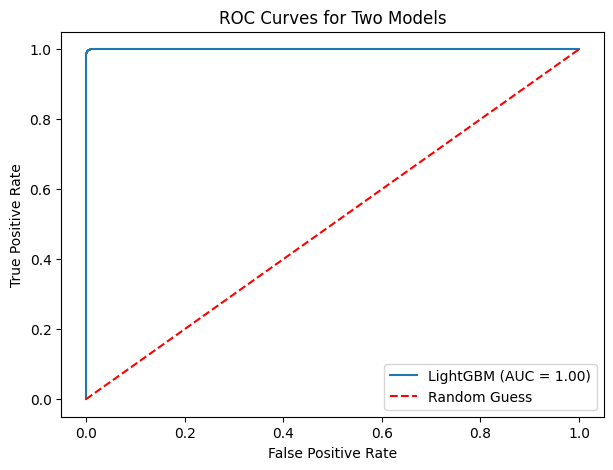

Fit + Predict time (seconds): 0.7497000694274902


In [33]:
models={
    "LightGBM":lgb.LGBMClassifier(random_state=42, class_weight=({0: (1-zero_ratio), 1:zero_ratio}), n_jobs=-1, categorical_feature = list(categorical_features))
}
lgb_cpu_models_time = mylib.make_prediction(models, df)
model_time['lgb_cpu_models_time']=lgb_cpu_models_time

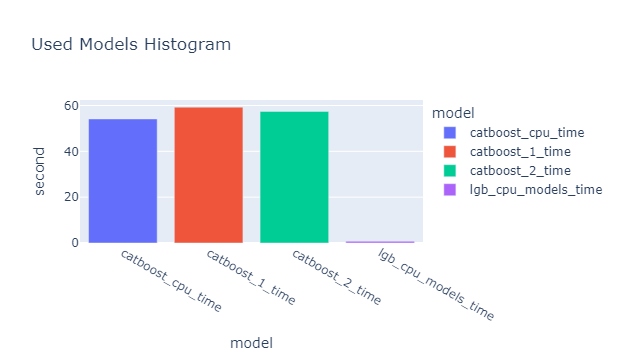

In [34]:
second_df = pd.DataFrame(list(model_time.items()), columns=['Model', 'Second'])
fig = px.bar(second_df, x='Model', y='Second', title='Used Models Histogram', labels={'Model': 'model', 'Second': 'second'}, color='Model')
fig.show()

In [35]:
"""models={
    "LightGBM":lgb.LGBMClassifier(random_state=42, class_weight=({0: (1-zero_ratio), 1:zero_ratio}), n_jobs=-1,
                                task_type='GPU', devices='1', gpu_ram_part=0.8, categorical_feature = list(categorical_features))
}
lgb_gpu_models_time = mylib.make_prediction(models, df)
model_time.append({'lgb_gpu_models_time':lgb_gpu_models_time})
"""

'models={\n    "LightGBM":lgb.LGBMClassifier(random_state=42, class_weight=({0: (1-zero_ratio), 1:zero_ratio}), n_jobs=-1,\n                                task_type=\'GPU\', devices=\'1\', gpu_ram_part=0.8, categorical_feature = list(categorical_features))\n}\nlgb_gpu_models_time = mylib.make_prediction(models, df)\nmodel_time.append({\'lgb_gpu_models_time\':lgb_gpu_models_time})\n'

<div style="color: white; display: block; border-radius: 5px; background-color: #2bcf34; width: 100%; height: 60%; font-size: 80%; font-family: Verdana; letter-spacing: 0.5px;">
    <h2 style="padding: 10px; color: white;">Preprocessing and Prediciton</h2>
</div>

In [36]:
df.head(3)

,Age,Gender,Income,Education_Level,Travel_Frequency,Preferred_Activities,Vacation_Budget,Location,Proximity_to_Mountains,Proximity_to_Beaches,Favorite_Season,Pets,Environmental_Concerns,Preference
0,56,male,71477,bachelor,9,skiing,2477,urban,175,267,summer,0,1,1
1,69,male,88740,master,1,swimming,4777,suburban,228,190,fall,0,1,0
2,46,female,46562,master,0,skiing,1469,urban,71,280,winter,0,0,1


<div class="alert alert-success" style="background-color: #a5e8a8; color:#245209;" role="alert ">
  Apply one-hot encoding
</div>

In [37]:
from sklearn.preprocessing import OneHotEncoder

columns_to_encode = ['Gender', 'Education_Level', 'Preferred_Activities', 'Location', 'Favorite_Season']
encoder = OneHotEncoder(sparse_output=False)
encoded_array = encoder.fit_transform(df[columns_to_encode])
encoded_df = pd.DataFrame(encoded_array, columns=encoder.get_feature_names_out(columns_to_encode))
final_df = pd.concat([df.drop(columns=columns_to_encode), encoded_df], axis=1)
# Type conversion category to int
category_columns = final_df.select_dtypes(include=['category']).columns
final_df[category_columns] = final_df[category_columns].apply(lambda col: col.cat.codes)

Xgboost
Training set performance
<class 'numpy.int32'>
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     31540
           1       1.00      1.00      1.00     10415

    accuracy                           1.00     41955
   macro avg       1.00      1.00      1.00     41955
weighted avg       1.00      1.00      1.00     41955

Roc-Auc Score Training set: 1.0
Test set performance
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7885
           1       1.00      1.00      1.00      2604

    accuracy                           1.00     10489
   macro avg       1.00      1.00      1.00     10489
weighted avg       1.00      1.00      1.00     10489

Roc-Auc Score Test set: 1.0
_._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._.
RandomForest
Training set performance
<class 'numpy.float64'>
              precision    recall  f1-score   support

           0

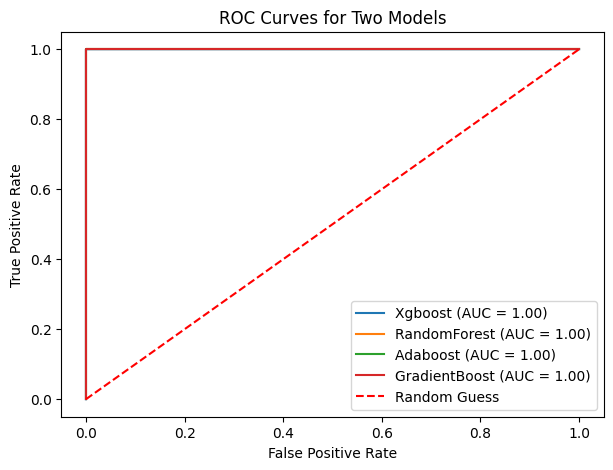

Fit + Predict time (seconds): 9.341196537017822


In [38]:
models={
    "Xgboost":XGBClassifier(class_weight=({0: (1-zero_ratio), 1:zero_ratio}), n_jobs=-1, task_type='GPU', devices='1', gpu_ram_part=0.8),
    "RandomForest":RandomForestClassifier(class_weight=({0: (1-zero_ratio), 1:zero_ratio}), n_jobs=-1),
    "Adaboost":AdaBoostClassifier(),
    "GradientBoost":GradientBoostingClassifier(),
}
other_models_time = mylib.make_prediction(models, final_df)
model_time['Xgboost_RF_Adaboost_GradientBoost']=other_models_time

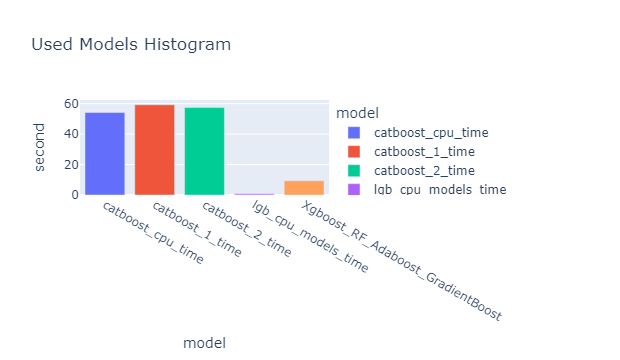

In [39]:
second_df = pd.DataFrame(list(model_time.items()), columns=['Model', 'Second'])
fig = px.bar(second_df, x='Model', y='Second', title='Used Models Histogram', labels={'Model': 'model', 'Second': 'second'}, color='Model')
fig.show()

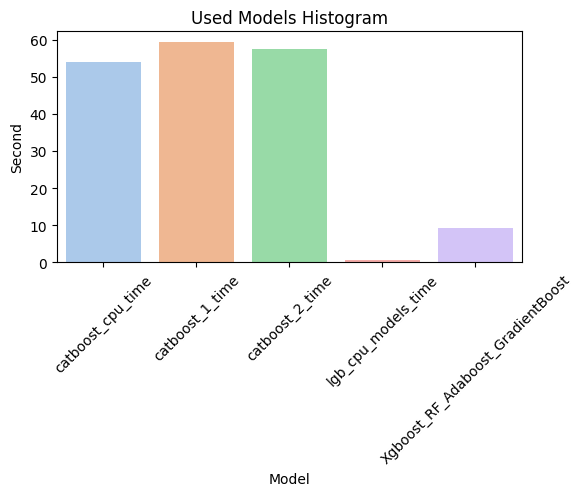

In [40]:
second_df = pd.DataFrame(list(model_time.items()), columns=['Model', 'Second'])

plt.figure(figsize=(6, 3))
sns.barplot(x='Model', y='Second', data=second_df, palette='pastel')
plt.title('Used Models Histogram')
plt.xlabel('Model')
plt.ylabel('Second')
plt.xticks(rotation=45)
plt.show()

<div class="alert alert-success" style="background-color: #a5e8a8; color:#245209;" role="alert ">
  Because of dataset is small, seconds are reverse order. This project only shows how to use algorithms.
</div>

<div style="color: white; display: block; border-radius: 5px; background-color: #2bcf34; width: 100%; height: 60%; font-size: 80%; font-family: Verdana; letter-spacing: 0.5px;">
    <h2 style="padding: 10px; color: white;">Preprocessed Dataset n_estimators</h2>
</div>

In [51]:
from sklearn.model_selection import train_test_split
category_columns = df.select_dtypes(include=['category']).columns
df[category_columns] = df[category_columns].apply(lambda col: col.cat.codes)

X = final_df.iloc[:,:-1]
y= final_df.iloc[:,-1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

Model test accuracy score with 1 decision-trees is 0.9601499936443371
Model train accuracy score with 1 decision-trees is 0.9853718332879324
Model test accuracy score with 2 decision-trees is 0.9619295792551164
Model train accuracy score with 2 decision-trees is 0.9861890493053664
Model test accuracy score with 3 decision-trees is 0.993008770814796
Model train accuracy score with 3 decision-trees is 0.9989376191773359
Model test accuracy score with 4 decision-trees is 0.9909749586881912
Model train accuracy score with 4 decision-trees is 0.99847453010079
Model test accuracy score with 5 decision-trees is 0.9982204143892208
Model train accuracy score with 5 decision-trees is 0.9999455189321711
Model test accuracy score with 10 decision-trees is 0.9999364433710436
Model train accuracy score with 10 decision-trees is 1.0
Model test accuracy score with 20 decision-trees is 1.0
Model train accuracy score with 20 decision-trees is 1.0
Model test accuracy score with 50 decision-trees is 1.0
M

[Text(0.5, 0, 'Number of iterations'), Text(0, 0.5, 'Accuracy')]

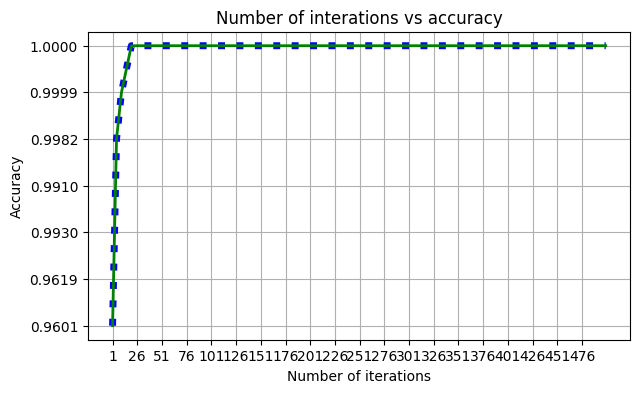

In [52]:
number_int = [1,2,3,4,5,10,20,50,70,100,200,400,500]
accuracy = []
train_accuracy = []
for i in number_int: 
    rfc = RandomForestClassifier(n_estimators=i, random_state=41)

    rfc.fit(X_train, y_train)
    y_pred_train = rfc.predict(X_train)
    y_pred = rfc.predict(X_test)
    
    accuracy.append('{0:0.4f}'.format(accuracy_score(y_test, y_pred)))
    train_accuracy.append('{0:0.4f}'.format(accuracy_score(y_train, y_pred_train)))
    print(f'Model test accuracy score with {i} decision-trees is {format(accuracy_score(y_test, y_pred))}')
    print(f'Model train accuracy score with {i} decision-trees is {format(accuracy_score(y_train, y_pred_train))}')
    
fig, ax = plt.subplots(figsize=(7,4))
ax.plot(number_int, accuracy, color='blue',linestyle=':', linewidth=5)
ax.plot(number_int, accuracy, color='green',linestyle='solid', linewidth=2, markersize=5 )
plt.xticks(np.arange(np.min(number_int), np.max(number_int), 25)) 
ax.title.set_text('Number of interations vs accuracy')
plt.grid(b=True)
ax.set(xlabel='Number of iterations', ylabel='Accuracy')

Model test accuracy score with 1 decision-trees is 0.9601499936443371
Model train accuracy score with 1 decision-trees is 0.9853718332879324
Model test accuracy score with 2 decision-trees is 0.9619295792551164
Model train accuracy score with 2 decision-trees is 0.9861890493053664
Model test accuracy score with 3 decision-trees is 0.993008770814796
Model train accuracy score with 3 decision-trees is 0.9989376191773359
Model test accuracy score with 4 decision-trees is 0.9909749586881912
Model train accuracy score with 4 decision-trees is 0.99847453010079
Model test accuracy score with 5 decision-trees is 0.9982204143892208
Model train accuracy score with 5 decision-trees is 0.9999455189321711
Model test accuracy score with 10 decision-trees is 0.9999364433710436
Model train accuracy score with 10 decision-trees is 1.0
Model test accuracy score with 20 decision-trees is 1.0
Model train accuracy score with 20 decision-trees is 1.0
Model test accuracy score with 40 decision-trees is 1.0
M

[Text(0.5, 0, 'Number of iterations'), Text(0, 0.5, 'Accuracy')]

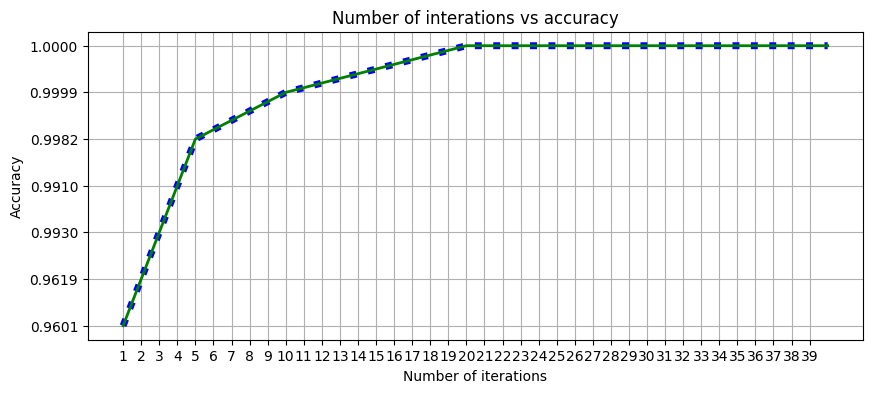

In [53]:
number_int = [1,2,3,4,5,10,20,40]
accuracy = []
train_accuracy = []
for i in number_int: 
    rfc = RandomForestClassifier(n_estimators=i, random_state=41)

    rfc.fit(X_train, y_train)
    y_pred_train = rfc.predict(X_train)
    y_pred = rfc.predict(X_test)
    
    accuracy.append('{0:0.4f}'.format(accuracy_score(y_test, y_pred)))
    train_accuracy.append('{0:0.4f}'.format(accuracy_score(y_train, y_pred_train)))
    print(f'Model test accuracy score with {i} decision-trees is {format(accuracy_score(y_test, y_pred))}')
    print(f'Model train accuracy score with {i} decision-trees is {format(accuracy_score(y_train, y_pred_train))}')
    
fig, ax = plt.subplots(figsize=(10,4))
ax.plot(number_int, accuracy, color='blue',linestyle=':', linewidth=5)
ax.plot(number_int, accuracy, color='green',linestyle='solid', linewidth=2, markersize=5 )
plt.xticks(np.arange(np.min(number_int), np.max(number_int), 1)) 
plt.grid(b=True)
ax.title.set_text('Number of interations vs accuracy')
ax.set(xlabel='Number of iterations', ylabel='Accuracy')

<div class="alert alert-success" style="background-color: #a5e8a8; color:#245209;" role="alert ">
  Best n_estimator parameter value is 20 n_estimator parameter indicates number of decision tree in random forest classifier.
</div>

<div style="color: white; display: block; border-radius: 5px; background-color: #2bcf34; width: 100%; height: 60%; font-size: 80%; font-family: Verdana; letter-spacing: 0.5px;">
    <h2 style="padding: 10px; color: white;">Dataset n_estimators</h2>
</div>

In [57]:
X = df.iloc[:,:-1]
y= df.iloc[:,-1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

Model test accuracy score with 1 decision-trees is 0.9570357188254734
Model train accuracy score with 1 decision-trees is 0.9844456551348406
Model test accuracy score with 2 decision-trees is 0.9600864370153807
Model train accuracy score with 2 decision-trees is 0.9857259602288205
Model test accuracy score with 3 decision-trees is 0.9776280666073471
Model train accuracy score with 3 decision-trees is 0.9962408063198038
Model test accuracy score with 4 decision-trees is 0.9779458497521292
Model train accuracy score with 4 decision-trees is 0.9962408063198038
Model test accuracy score with 5 decision-trees is 0.985064192195246
Model train accuracy score with 5 decision-trees is 0.9985834922364478
Model test accuracy score with 10 decision-trees is 0.9877335706114148
Model train accuracy score with 10 decision-trees is 0.9997003541269409
Model test accuracy score with 20 decision-trees is 0.9922460912673192
Model train accuracy score with 20 decision-trees is 1.0
Model test accuracy score

[Text(0.5, 0, 'Number of iterations'), Text(0, 0.5, 'Accuracy')]

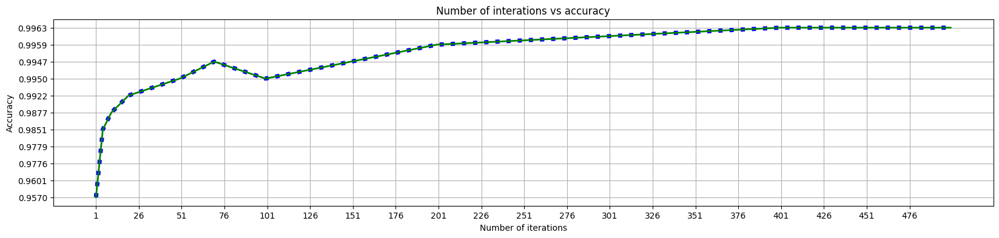

In [60]:
number_int = [1,2,3,4,5,10,20,50,70,100,200,400,500]
accuracy = []
train_accuracy = []
for i in number_int: 
    rfc = RandomForestClassifier(n_estimators=i, random_state=41)

    rfc.fit(X_train, y_train)
    y_pred_train = rfc.predict(X_train)
    y_pred = rfc.predict(X_test)
    
    accuracy.append('{0:0.4f}'.format(accuracy_score(y_test, y_pred)))
    train_accuracy.append('{0:0.4f}'.format(accuracy_score(y_train, y_pred_train)))
    print(f'Model test accuracy score with {i} decision-trees is {format(accuracy_score(y_test, y_pred))}')
    print(f'Model train accuracy score with {i} decision-trees is {format(accuracy_score(y_train, y_pred_train))}')
    
fig, ax = plt.subplots(figsize=(20,4))
ax.plot(number_int, accuracy, color='blue',linestyle=':', linewidth=5)
ax.plot(number_int, accuracy, color='green',linestyle='solid', linewidth=2, markersize=5 )
plt.xticks(np.arange(np.min(number_int), np.max(number_int), 25)) 
ax.title.set_text('Number of interations vs accuracy')
plt.grid(b=True)
ax.set(xlabel='Number of iterations', ylabel='Accuracy')

<div class="alert alert-success" style="background-color: #a5e8a8; color:#245209;" role="alert ">
  Best n_estimator parameter value is 375 n_estimator parameter indicates number of decision tree in random forest classifier.
</div>

<div class="alert alert-warning" style="background-color: #1d0aad; color:white;" role="alert ">
    <h4>
    <strong>
    Result : With one-hot encoding, number of estimator (# of decision tree) significantly decreased from 375 to 20.<br>
    </strong>
    </h4>
</div>

<div style="color: white; display: block; border-radius: 5px; background-color: #2bcf34; width: 100%; height: 60%; font-size: 80%; font-family: Verdana; letter-spacing: 0.5px;">
    <h2 style="padding: 10px; color: white;">Feature Importance</h2>
</div>

In [48]:
rfc = RandomForestClassifier(n_estimators=20, random_state=42)
rfc.fit(X_train, y_train)
feature_names =  X_train.columns
y_pred = rfc.predict(X_test)
importances = rfc.feature_importances_
feature_imp_df = pd.DataFrame({'Feature': feature_names, 'Gini Importance': importances}).sort_values('Gini Importance', ascending=False) 
print(feature_imp_df)

                   Feature  Gini Importance
5     Preferred_Activities         0.405273
9     Proximity_to_Beaches         0.264013
8   Proximity_to_Mountains         0.247174
6          Vacation_Budget         0.018695
2                   Income         0.018248
0                      Age         0.014966
4         Travel_Frequency         0.008722
10         Favorite_Season         0.005374
3          Education_Level         0.005206
7                 Location         0.004008
1                   Gender         0.003877
12  Environmental_Concerns         0.002273
11                    Pets         0.002171


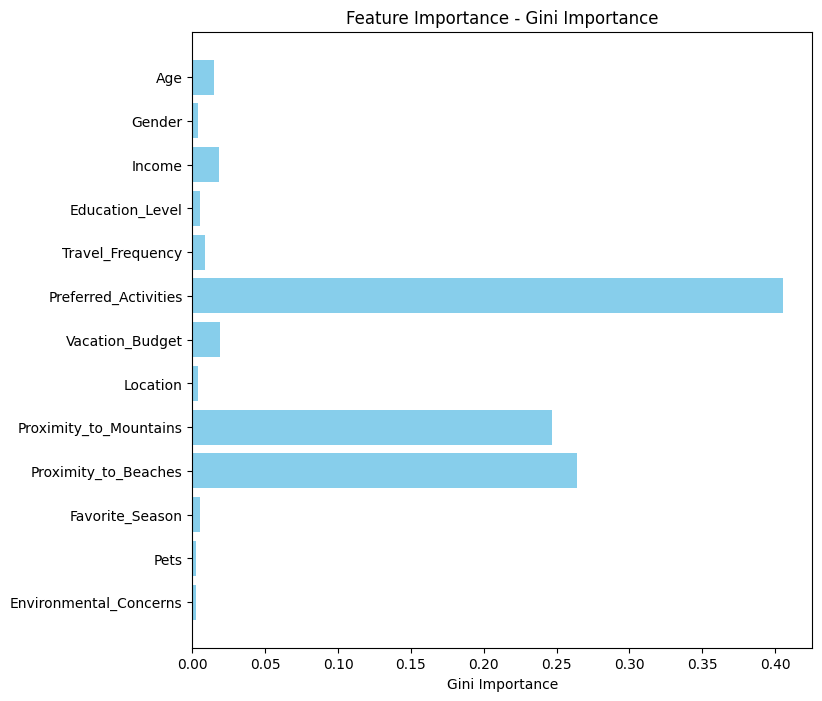

In [49]:
plt.figure(figsize=(8, 8))
plt.barh(feature_names, importances, color='skyblue')
plt.xlabel('Gini Importance')
plt.title('Feature Importance - Gini Importance')
plt.gca().invert_yaxis()
plt.show()

<div style="color: white; display: block; border-radius: 5px; background-color: #2bcf34; width: 100%; height: 60%; font-size: 80%; font-family: Verdana; letter-spacing: 0.5px;">
    <h2 style="padding: 10px; color: white;">Elbow Method</h2>
</div>

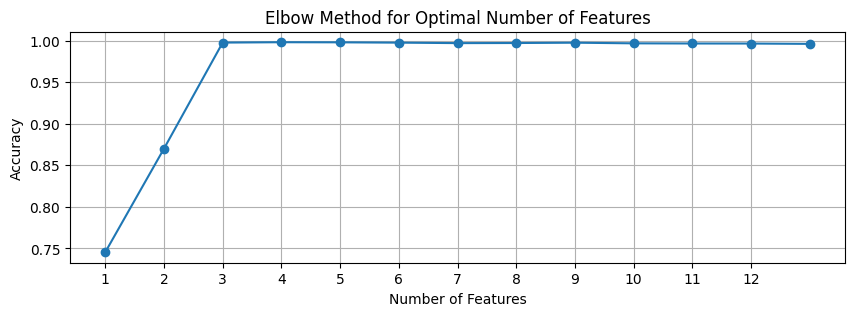

In [67]:
X = df.iloc[:,:-1]
y= df.iloc[:,-1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
feature_importances = feature_imp_df.Feature
accuracies = []

for i in range(1, X_train.shape[1] + 1):
    selected_features = feature_importances[:i].index
    X_train_selected = X_train.iloc[:, selected_features]
    X_test_selected = X_test.iloc[:, selected_features]
    rf = RandomForestClassifier(random_state=42)
    rf.fit(X_train_selected, y_train)
    y_pred = rf.predict(X_test_selected)
    accuracy = accuracy_score(y_test, y_pred)
    accuracies.append(accuracy)

plt.figure(figsize=(10, 3))
plt.plot(range(1, len(accuracies) + 1), accuracies, marker='o')
plt.xticks(np.arange(1, len(feature_importances), 1))
plt.title('Elbow Method for Optimal Number of Features')
plt.xlabel('Number of Features')
plt.ylabel('Accuracy')
plt.grid()
plt.show()

In [68]:
feature_importances[:3].values

array(['Preferred_Activities', 'Proximity_to_Beaches',
       'Proximity_to_Mountains'], dtype=object)

<div class="alert alert-success" style="background-color: #a5e8a8; color:#245209;" role="alert ">
  As we can see, only first 3 feature is enough to predict accurately. people preference.
</div>

In [69]:
feature_importances_list = feature_importances[:3].values.tolist()
feature_importances_list.append('Preference')
feature_importances_list

['Preferred_Activities',
 'Proximity_to_Beaches',
 'Proximity_to_Mountains',
 'Preference']

<div style="color: white; display: block; border-radius: 5px; background-color: #2bcf34; width: 100%; height: 60%; font-size: 80%; font-family: Verdana; letter-spacing: 0.5px;">
    <h2 style="padding: 10px; color: white;">Results with and without feature selection</h2>
</div>

RandomForest
Training set performance
<class 'numpy.int64'>
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     31437
           1       1.00      1.00      1.00     10518

    accuracy                           1.00     41955
   macro avg       1.00      1.00      1.00     41955
weighted avg       1.00      1.00      1.00     41955

Roc-Auc Score Training set: 1.0
Test set performance
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      7859
           1       0.99      0.98      0.98      2630

    accuracy                           0.99     10489
   macro avg       0.99      0.99      0.99     10489
weighted avg       0.99      0.99      0.99     10489

Roc-Auc Score Test set: 0.9873821009745433
_._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._.


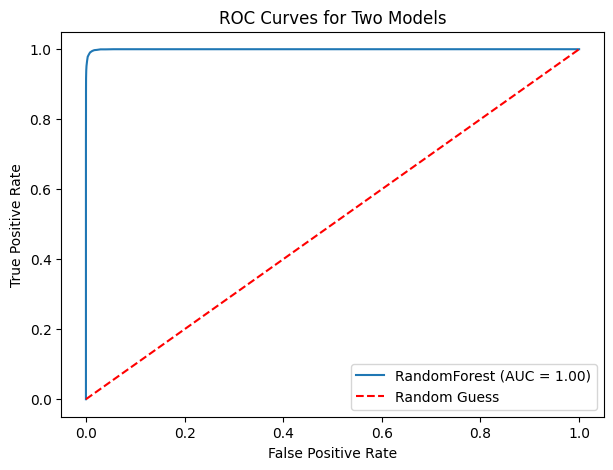

Fit + Predict time (seconds): 0.45163631439208984


In [70]:
X = df.iloc[:,:-1]
y= df.iloc[:,-1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

models={
    "RandomForest":RandomForestClassifier(class_weight=({0: (1-zero_ratio), 1:zero_ratio}),n_estimators=20 ,n_jobs=-1)
}
other_models_time = mylib.make_prediction(models, df)

RandomForest
Training set performance
<class 'numpy.int64'>
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     31437
           1       1.00      1.00      1.00     10518

    accuracy                           1.00     41955
   macro avg       1.00      1.00      1.00     41955
weighted avg       1.00      1.00      1.00     41955

Roc-Auc Score Training set: 0.9999524624453318
Test set performance
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7859
           1       1.00      0.99      0.99      2630

    accuracy                           1.00     10489
   macro avg       1.00      1.00      1.00     10489
weighted avg       1.00      1.00      1.00     10489

Roc-Auc Score Test set: 0.9958781121835082
_._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._._.


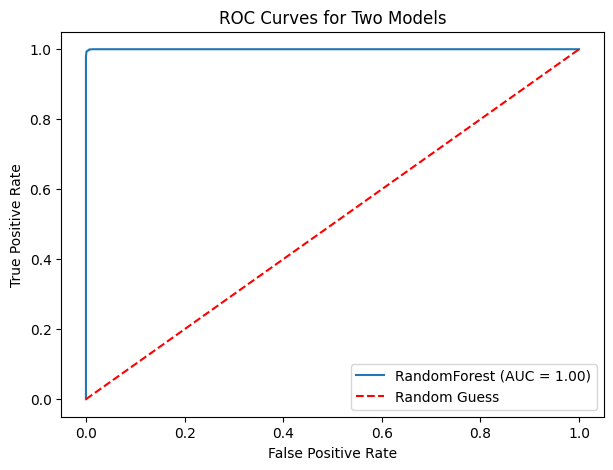

Fit + Predict time (seconds): 0.3981437683105469


In [71]:
X = df[feature_importances_list].iloc[:,:-1]
y= df[feature_importances_list].iloc[:,-1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

models={
    "RandomForest":RandomForestClassifier(class_weight=({0: (1-zero_ratio), 1:zero_ratio}),n_estimators=20 ,n_jobs=-1)
}
other_models_time = mylib.make_prediction(models, df[feature_importances_list])

In [74]:
1.0 > 0.9999524624453318

True

In [75]:
0.9873821009745433 > 0.9958781121835082

False

<div class="alert alert-warning" style="background-color: #1d0aad; color:white;" role="alert ">
    <h4>
    <strong>
    By applying feature selection with using elbow method, model performance improved. <br>
    Train accuracy is decreased and test accuracy is increased. <br>
    Thus, not only model gave better result but also model complexity is decreased.
    </strong>
    </h4>
</div>

<div style="color: white; display: block; border-radius: 5px; background-color: #2bcf34; width: 100%; height: 60%; font-size: 80%; font-family: Verdana; letter-spacing: 0.5px;">
    <h2 style="padding: 10px; color: white;">Hyperparameter Tuning and cross validation on selected features</h2>
</div>

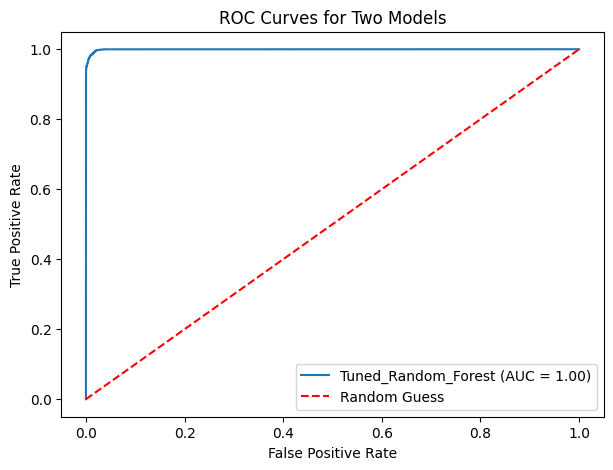

Training set performance
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     27453
           1       0.99      0.97      0.98      9257

    accuracy                           0.99     36710
   macro avg       0.99      0.98      0.99     36710
weighted avg       0.99      0.99      0.99     36710

Roc-Auc Score Training set: 0.982701392515361
Test set performance
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     11843
           1       0.99      0.96      0.97      3891

    accuracy                           0.99     15734
   macro avg       0.99      0.98      0.98     15734
weighted avg       0.99      0.99      0.99     15734

Roc-Auc Score Test set: 0.9777895013082692


Best hyperparameters: ['max_depth', 'min_samples_leaf', 'min_samples_split']
Best values: [5, 3, 6]
Accuracy with best hyperparameters: 0.9876


In [76]:
from sklearn.model_selection import GridSearchCV, KFold
param_grid = {
    'max_depth': [4,5], 
     'min_samples_leaf': [2,3],
     'min_samples_split': [5,6],
}
scoring = ['accuracy', 'precision', 'recall', 'f1']
best_hyperparameters = {}
best_values = {}

model = RandomForestClassifier(class_weight=({0: (1-zero_ratio), 1:zero_ratio}), n_estimators=20, n_jobs=-1)

grid_search = GridSearchCV(estimator=model, param_grid=param_grid, 
                           scoring=scoring, cv=10, refit='f1')

grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
best_hyperparameters = list(best_params.keys())
best_values = list(best_params.values())
best_model = RandomForestClassifier(**best_params)
best_model.fit(X_train, y_train)

predictions={'True': y_test}
y_pred = best_model.predict(X_test)
y_train_pred = best_model.predict(X_train)
predictions['Tuned_Random_Forest'] = best_model.predict_proba(X_test)[:, 1]
mylib.plot_model_roc_auc_curve(['Tuned_Random_Forest'], predictions)

accuracy = accuracy_score(y_test, y_pred)

print("Training set performance")
print(classification_report(y_train, y_train_pred, target_names=['0','1']))
model_train_rocauc_score = roc_auc_score(y_train, y_train_pred)
print(f"Roc-Auc Score Training set: {model_train_rocauc_score}")
print("Test set performance")
print(classification_report(y_test, y_pred, target_names=['0','1']))
model_test_rocauc_score = roc_auc_score(y_test, y_pred)
print(f"Roc-Auc Score Test set: {model_test_rocauc_score}")

print('\n\nBest hyperparameters:', best_hyperparameters)
print('Best values:', best_values)
print(f'Accuracy with best hyperparameters: {accuracy:.4f}')

<div class="alert alert-warning" style="background-color: #a6121f; color:white;" role="alert ">
    <h4>
    <strong>
    By applying feature selection with using elbow method, hyper parameter tuning and 10 fold cross validation, model performance improved more. <br>
    Model has gained stability on train and test accuracy.
    </strong>
    </h4>
</div>

In [77]:
# end